# Sampler validation (issue #29)

Two analyses feeding the US-scale sampling design:

1. **p-value vs visible physical change** — for bins of the structural-change p-value,
   fetch NAIP image pairs (~2013 vs ~2024) at tract centroids and eyeball whether low
   p-values correspond to visible construction/demolition. If the images look
   independent of p, the flag is not a useful physical-change indicator for twin sampling.
2. **Sampling-scheme table** — % of tracts touched per CBSA under (a) uniform random
   tract sampling, (b) population-weighted, (c) city-first (uniform over CBSAs, then a
   tract within). Informs the out-of-sample-validity question: uniform oversamples big
   metros' tracts proportionally; city-first oversamples small metros per tract.

Conclusions go as a comment on #29 (and anything missing for the sampler → #33).

Runtime knobs via env: `N_PER_BIN` (default 20 tracts per p-bin), `INDICATOR` (default
`W2_r5`). Crops are cached under `~/outputs/sampler_validation/` so re-runs are cheap.

In [3]:
import os
from pathlib import Path

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

from src.utils.paths import PROCESSED_DATA_DIR
from src.data import indicators
from src.data.naip_fetcher import fetch_naip, get_fetch_stats

N_PER_BIN = int(os.environ.get("N_PER_BIN", 20))
INDICATOR = os.environ.get("INDICATOR", indicators.DEFAULT_INDICATOR)
YEAR_EARLY, YEAR_LATE = 2013, 2024
CROP_METERS, OUT_PIXELS = 300, 256
SEED = 825

CACHE_DIR = Path.home() / "outputs" / "sampler_validation"
CACHE_DIR.mkdir(parents=True, exist_ok=True)

PANEL_PATH = PROCESSED_DATA_DIR / "us_metros_panel_2011_2023.feather"
panel = gpd.read_feather(PANEL_PATH)
geoid_col = sorted(c for c in panel.columns if c.startswith("geoid_"))[-1]
print(f"{len(panel):,} tracts | {panel['cbsa_code'].nunique()} CBSAs | key={geoid_col} | indicator={INDICATOR}")

55,061 tracts | 109 CBSAs | key=geoid_2023 | indicator=W2_r5


## 1. p-value bins → NAIP pairs

The panel carries the first-vs-last z-test per indicator: `pvalue_2011_2023` for income,
`pvalue_{var}_2014_2023` for the wealth indexes (VRE starts 2014). We bin tracts by that
p-value and fetch a ~2013 / ~2024 NAIP pair at each sampled tract centroid.

In [4]:
# Locate the p-value column for the selected indicator
var = indicators.token_to_var(INDICATOR)
if var is None:
    pval_candidates = [c for c in panel.columns if c.startswith("pvalue_2")]
else:
    pval_candidates = [c for c in panel.columns if c.startswith(f"pvalue_{var}_")]
assert pval_candidates, f"No p-value column for indicator {INDICATOR} — regenerate the panel"
PVAL_COL = pval_candidates[0]

BIN_EDGES = [0, 0.01, 0.05, 0.10, 0.25, 1.0]
BIN_LABELS = ["p<0.01", "0.01-0.05", "0.05-0.10", "0.10-0.25", "p>=0.25"]

tracts = panel[[geoid_col, "cbsa_code", PVAL_COL, "geometry"]].dropna(subset=[PVAL_COL]).copy()
tracts["p_bin"] = pd.cut(tracts[PVAL_COL], bins=BIN_EDGES, labels=BIN_LABELS, include_lowest=True)
display(tracts["p_bin"].value_counts().sort_index().to_frame("n_tracts"))

sampled = (
    tracts.groupby("p_bin", observed=True, group_keys=False)
    .apply(lambda g: g.sample(min(N_PER_BIN, len(g)), random_state=SEED))
)
centroids = sampled.geometry.centroid.to_crs("EPSG:4326")
sampled["lon"], sampled["lat"] = centroids.x, centroids.y
print(f"Sampled {len(sampled)} tracts across {sampled['p_bin'].nunique()} bins ({PVAL_COL})")

,n_tracts
p_bin,
p<0.01,7044
0.01-0.05,5912
0.05-0.10,4284
0.10-0.25,8860
p>=0.25,28005


Sampled 100 tracts across 5 bins (pvalue_W2_i_r5pct_2014_2023)


/tmp/ipykernel_2227/391038656.py:19: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.sample(min(N_PER_BIN, len(g)), random_state=SEED))


In [5]:
def fetch_pair(geoid, lon, lat):
    """(early, late, early_year, late_year) NAIP RGB crops, disk-cached."""
    cache = CACHE_DIR / f"{geoid}.npz"
    if cache.exists():
        d = np.load(cache)
        return d["early"], d["late"], int(d["early_year"]), int(d["late_year"])
    r_early = fetch_naip(lon, lat, CROP_METERS, nbands=3, out_pixels=OUT_PIXELS, year_hint=YEAR_EARLY)
    r_late = fetch_naip(lon, lat, CROP_METERS, nbands=3, out_pixels=OUT_PIXELS, year_hint=YEAR_LATE)
    if r_early.crop is None or r_late.crop is None:
        return None
    np.savez_compressed(cache, early=r_early.crop, late=r_late.crop,
                        early_year=r_early.actual_year, late_year=r_late.actual_year)
    return r_early.crop, r_late.crop, r_early.actual_year, r_late.actual_year

pairs = {}
for _, row in sampled.iterrows():
    res = fetch_pair(row[geoid_col], row["lon"], row["lat"])
    if res is not None:
        pairs[row[geoid_col]] = res
print(f"Fetched {len(pairs)}/{len(sampled)} pairs | fetcher stats: {get_fetch_stats()}")

Fetched 100/100 pairs | fetcher stats: {'ok': 170, 'no_items': 0, 'asset_missing': 0, 'read_error': 0, 'nir_padded': 0}


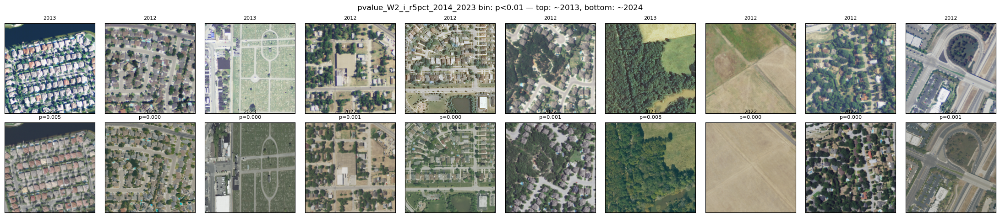

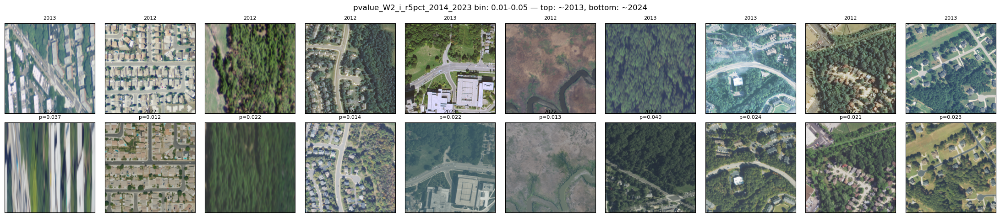

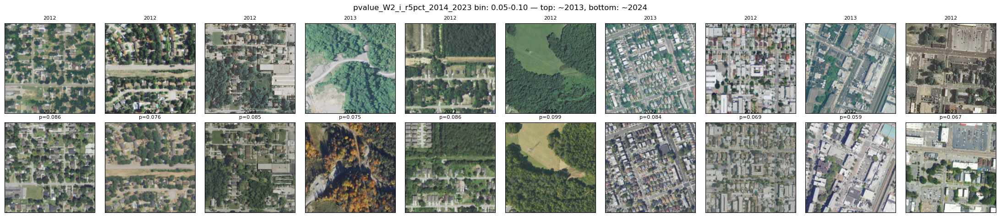

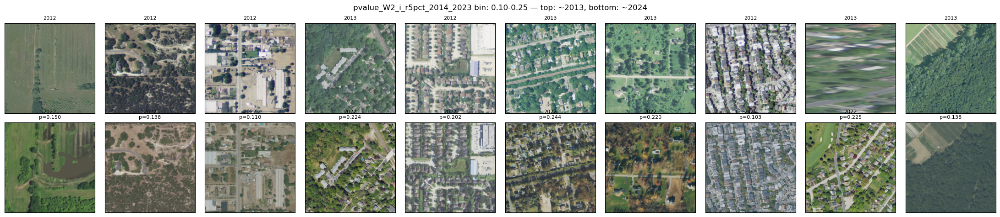

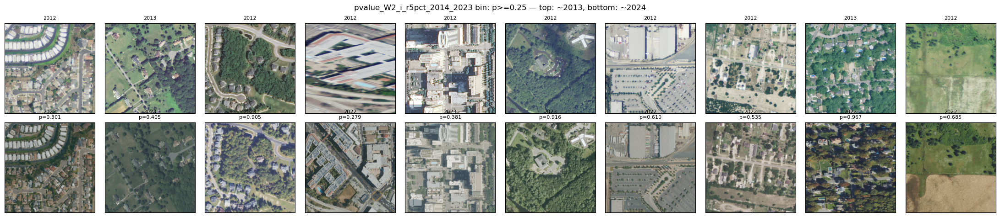

In [9]:
def show_bin(bin_label, max_cols=10):
    sub = sampled[sampled["p_bin"] == bin_label]
    sub = sub[sub[geoid_col].isin(pairs)]
    if sub.empty:
        print(f"{bin_label}: no fetched pairs")
        return
    n = min(len(sub), max_cols)
    fig, axes = plt.subplots(2, n, figsize=(2.2 * n, 4.8))
    axes = np.atleast_2d(axes)
    if n == 1:
        axes = axes.reshape(2, 1)
    for j, (_, row) in enumerate(sub.head(n).iterrows()):
        early, late, y0, y1 = pairs[row[geoid_col]]
        axes[0, j].imshow(np.moveaxis(early, 0, -1)); axes[0, j].set_title(f"{y0}", fontsize=8)
        axes[1, j].imshow(np.moveaxis(late, 0, -1)); axes[1, j].set_title(f"{y1}\np={row[PVAL_COL]:.3f}", fontsize=8)
        for ax in (axes[0, j], axes[1, j]):
            ax.set_xticks([]); ax.set_yticks([])
    fig.suptitle(f"{PVAL_COL} bin: {bin_label} — top: ~{YEAR_EARLY}, bottom: ~{YEAR_LATE}")
    fig.tight_layout()
    safe = bin_label.replace('<', 'lt').replace('>=', 'ge')
    fig.savefig(CACHE_DIR / f"pairs_{safe}.png", dpi=300)
    plt.show()

for lbl in BIN_LABELS:
    show_bin(lbl)

In [10]:
CACHE_DIR

PosixPath('/home/abbatenicolas/outputs/sampler_validation')

**Eyeball question:** do the `p<0.01` pairs show visible re-development (new towers,
cleared lots, densification) at rates clearly above the `p>=0.25` pairs? If yes, the flag
is informative for stable/change twin sampling; if the two ends look the same, the
significance test tracks compositional (people) change, not physical change, and the
change-twin channel should not lean on it.

## 2. Sampling schemes: % of tracts touched per CBSA

Simulate `N_DRAWS` tract draws under each scheme and tabulate, per CBSA, the share of its
tracts touched at least once and the share of total draws it receives.

In [7]:
N_DRAWS = 50_000
pop_col = [c for c in panel.columns if c.startswith("total_population_")][-1]
univ = panel[[geoid_col, "cbsa_code", pop_col]].dropna(subset=[pop_col]).reset_index(drop=True)
rng = np.random.default_rng(SEED)

def simulate(weights=None, city_first=False):
    if city_first:
        cbsas = univ["cbsa_code"].unique()
        by_cbsa = {c: g.index.to_numpy() for c, g in univ.groupby("cbsa_code")}
        chosen = rng.choice(cbsas, size=N_DRAWS, replace=True)
        idx = np.array([rng.choice(by_cbsa[c]) for c in chosen])
    else:
        p = None if weights is None else (weights / weights.sum())
        idx = rng.choice(len(univ), size=N_DRAWS, replace=True, p=p)
    touched = univ.iloc[np.unique(idx)].groupby("cbsa_code")[geoid_col].count()
    draw_share = univ.iloc[idx].groupby("cbsa_code")[geoid_col].count() / N_DRAWS
    return touched, draw_share

total_tracts = univ.groupby("cbsa_code")[geoid_col].count()
schemes = {
    "uniform": simulate(),
    "pop_weighted": simulate(weights=univ[pop_col].to_numpy(dtype=float)),
    "city_first": simulate(city_first=True),
}

table = pd.DataFrame({"n_tracts": total_tracts})
for name, (touched, draw_share) in schemes.items():
    table[f"pct_touched_{name}"] = (touched.reindex(total_tracts.index).fillna(0) / total_tracts * 100).round(1)
    table[f"draw_share_{name}"] = (draw_share.reindex(total_tracts.index).fillna(0) * 100).round(2)
table = table.sort_values("n_tracts", ascending=False)
table.to_csv(CACHE_DIR / "sampling_scheme_table.csv")
print(f"Saved {CACHE_DIR / 'sampling_scheme_table.csv'}")
display(table.head(15))
display(table.tail(10))

Saved /home/abbatenicolas/outputs/sampler_validation/sampling_scheme_table.csv


,n_tracts,pct_touched_uniform,draw_share_uniform,pct_touched_pop_weighted,draw_share_pop_weighted,pct_touched_city_first,draw_share_city_first
cbsa_code,,,,,,,
35620,4903,58.7,8.65,56.3,8.86,8.6,0.89
31080,3108,60.3,5.66,56.8,5.67,13.7,0.90
16980,2288,59.6,4.09,56.3,4.11,18.4,0.94
19100,1704,61.0,3.24,59.7,3.39,23.3,0.94
26420,1612,59.6,2.91,58.6,3.20,26.2,0.96
37980,1554,59.2,2.81,57.3,2.83,25.2,0.94
12060,1504,59.0,2.64,59.5,2.86,28.1,0.98
33100,1494,60.6,2.76,58.0,2.85,26.0,0.89
47900,1464,61.3,2.73,58.6,2.78,24.9,0.86


,n_tracts,pct_touched_uniform,draw_share_uniform,pct_touched_pop_weighted,draw_share_pop_weighted,pct_touched_city_first,draw_share_city_first
cbsa_code,,,,,,,
20500,136,59.6,0.25,62.5,0.26,94.9,0.93
35300,135,62.2,0.27,50.4,0.23,97.0,0.90
25420,132,59.8,0.24,56.1,0.27,97.7,0.90
36260,127,63.0,0.26,63.8,0.29,97.6,0.93
26620,118,56.8,0.21,55.9,0.21,99.2,0.93
29540,116,57.8,0.21,69.0,0.27,98.3,0.88
22220,115,58.3,0.21,55.7,0.22,94.8,0.92
37860,114,65.8,0.21,46.5,0.17,96.5,0.90
33700,112,51.8,0.18,73.2,0.27,100.0,0.87


,pct_touched_uniform,pct_touched_pop_weighted,pct_touched_city_first
count,109.0,109.0,109.0
mean,60.2,56.6,72.8
std,3.1,5.1,24.2
min,51.0,42.9,8.6
25%,58.9,53.6,55.1
50%,60.3,56.9,83.5
75%,62.3,59.3,92.3
max,69.9,73.2,100.0


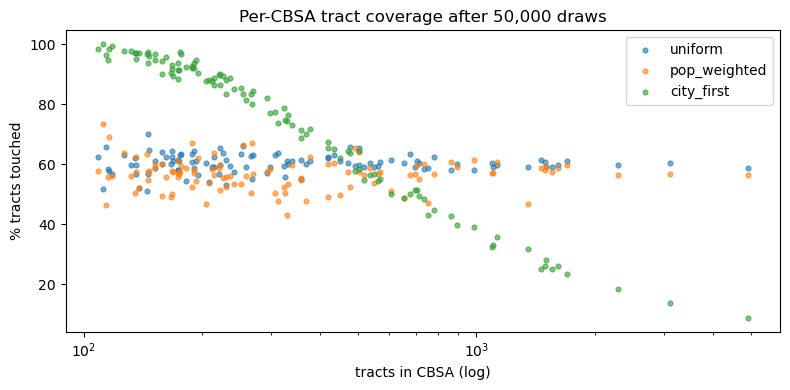

In [8]:
# Summary: dispersion of per-CBSA coverage under each scheme
summary = pd.DataFrame({
    f"pct_touched_{name}": table[f"pct_touched_{name}"].describe().round(1)
    for name in schemes
})
display(summary)

fig, ax = plt.subplots(figsize=(8, 4))
for name in schemes:
    ax.scatter(table["n_tracts"], table[f"pct_touched_{name}"], s=12, alpha=0.6, label=name)
ax.set_xscale("log")
ax.set_xlabel("tracts in CBSA (log)")
ax.set_ylabel("% tracts touched")
ax.legend(); ax.set_title(f"Per-CBSA tract coverage after {N_DRAWS:,} draws")
fig.tight_layout()
fig.savefig(CACHE_DIR / "coverage_by_scheme.png", dpi=120)
plt.show()

**Reading the table:** `uniform` gives every tract equal probability → equal %-touched
everywhere but draw share ∝ metro size (NY dominates batches). `pop_weighted` further
tilts toward dense tracts ("most-seen places are where people live"). `city_first`
equalizes draw share across metros → small metros get far higher per-tract coverage,
big metros' tracts are rarely revisited. For out-of-sample validity across city sizes
(#31 metrics), `city_first` maximizes small-metro exposure; the batch sampler currently
weights (year, CBSA) pools by pool size, i.e. close to `uniform`. Record the decision in #29.